In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

In [2]:
data = pd.read_csv('API_Trend.csv')
data['DATE'] = pd.to_datetime(data['DATE'], format='%d-%m-%y')
data['SUM_COUNT'] = data.groupby(['DATE','APPNAME', 'API'])['COUNT'].transform('sum')
data_gp = data.drop_duplicates(['DATE','APPNAME', 'API'])
data_gp.drop(['COUNT', 'STATUS'], axis=1, inplace=True)
data_gp = data_gp.reset_index(drop=True)
data_gp

/tmp/ipykernel_508/2176322563.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_gp.drop(['COUNT', 'STATUS'], axis=1, inplace=True)


,DATE,APPNAME,API,SUM_COUNT
0,2023-07-04,App1,API18,8
1,2023-07-04,App1,API19,767
2,2023-07-04,App10,API24,12
3,2023-07-04,App100,API17,3398
4,2023-07-04,App100,API18,18878
...,...,...,...,...
23098,2023-09-19,App98,API19,1589
23099,2023-09-19,App98,API24,1130
23100,2023-09-19,App98,API7,5810889
23101,2023-09-19,App99,API15,1452685


In [3]:
data_gp.sort_values(['APPNAME','API', 'DATE'])

,DATE,APPNAME,API,SUM_COUNT
0,2023-07-04,App1,API18,8
301,2023-07-05,App1,API18,9
599,2023-07-06,App1,API18,5
898,2023-07-07,App1,API18,18
1197,2023-07-08,App1,API18,17
...,...,...,...,...
21947,2023-09-15,App99,API7,1771507
22234,2023-09-16,App99,API7,1707483
22520,2023-09-17,App99,API7,1462243
22812,2023-09-18,App99,API7,1466856


In [4]:
Applist = data_gp.APPNAME.unique()
Applist = [int(app.replace('App', '')) for app in Applist]
Applist.sort()
for i in Applist:
    Applist[Applist.index(i)] = 'App' + str(i)
Applist

['App1',
 'App2',
 'App3',
 'App4',
 'App5',
 'App6',
 'App7',
 'App8',
 'App9',
 'App10',
 'App11',
 'App12',
 'App13',
 'App14',
 'App15',
 'App16',
 'App17',
 'App18',
 'App19',
 'App20',
 'App21',
 'App22',
 'App23',
 'App24',
 'App25',
 'App26',
 'App27',
 'App28',
 'App29',
 'App30',
 'App31',
 'App32',
 'App33',
 'App34',
 'App35',
 'App36',
 'App37',
 'App38',
 'App39',
 'App40',
 'App41',
 'App42',
 'App43',
 'App44',
 'App45',
 'App46',
 'App47',
 'App48',
 'App49',
 'App50',
 'App51',
 'App52',
 'App53',
 'App54',
 'App55',
 'App56',
 'App57',
 'App58',
 'App59',
 'App60',
 'App61',
 'App62',
 'App63',
 'App64',
 'App65',
 'App66',
 'App67',
 'App68',
 'App69',
 'App70',
 'App71',
 'App72',
 'App73',
 'App74',
 'App75',
 'App76',
 'App77',
 'App78',
 'App79',
 'App80',
 'App81',
 'App82',
 'App83',
 'App84',
 'App85',
 'App86',
 'App87',
 'App88',
 'App89',
 'App90',
 'App91',
 'App92',
 'App93',
 'App94',
 'App95',
 'App96',
 'App97',
 'App98',
 'App99',
 'App100',
 'App101

In [5]:
APIlist = []
for i in Applist:
    APIlist.append(data_gp[data_gp['APPNAME'] == i].API.unique())
APIlist

[array(['API18', 'API19'], dtype=object),
 array(['API12', 'API15', 'API17', 'API18', 'API19', 'API23', 'API24',
        'API7'], dtype=object),
 array(['API10', 'API12', 'API14', 'API15', 'API17', 'API18', 'API19',
        'API23', 'API24', 'API7', 'API8', 'API9', 'API25', 'API21', 'API3'],
       dtype=object),
 array(['API7'], dtype=object),
 array(['API10', 'API12', 'API15', 'API24'], dtype=object),
 array(['API12', 'API15', 'API18', 'API19', 'API24', 'API7'], dtype=object),
 array(['API10', 'API12', 'API15'], dtype=object),
 array(['API24', 'API9'], dtype=object),
 array(['API24'], dtype=object),
 array(['API24', 'API10', 'API12', 'API9'], dtype=object),
 array(['API24', 'API10', 'API12', 'API9'], dtype=object),
 array(['API24', 'API10', 'API12', 'API9'], dtype=object),
 array(['API15'], dtype=object),
 array(['API15'], dtype=object),
 array(['API15'], dtype=object),
 array(['API15'], dtype=object),
 array(['API15', 'API7'], dtype=object),
 array(['API7', 'API15', 'API24'], dtype=

/tmp/ipykernel_508/2938858959.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ind_data['zsc'] = zscored_count
/home/prime/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/prime/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/prime/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprec

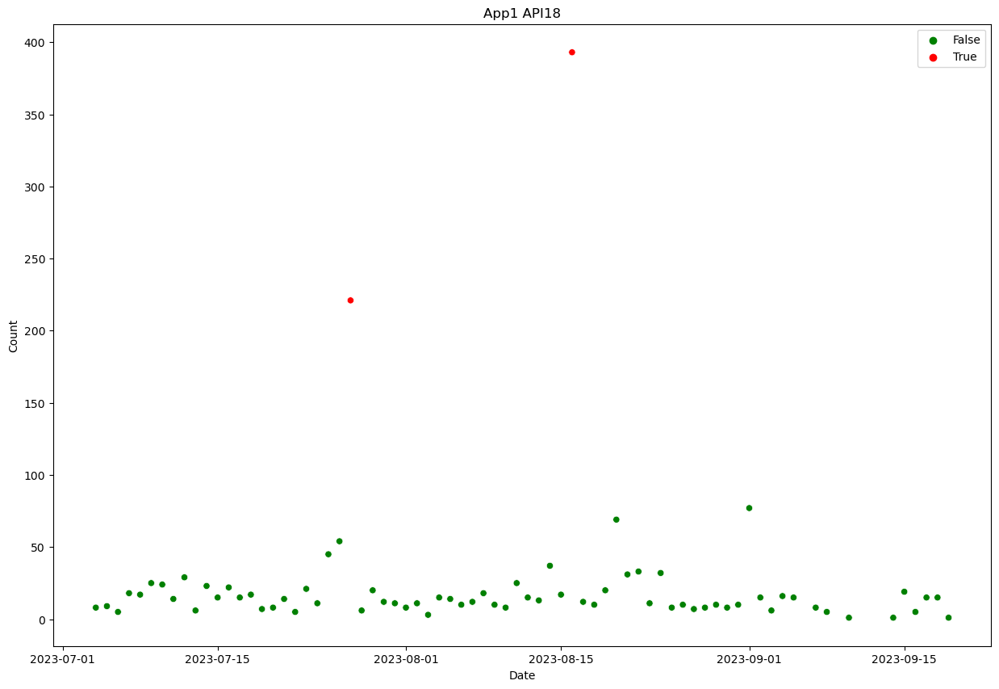

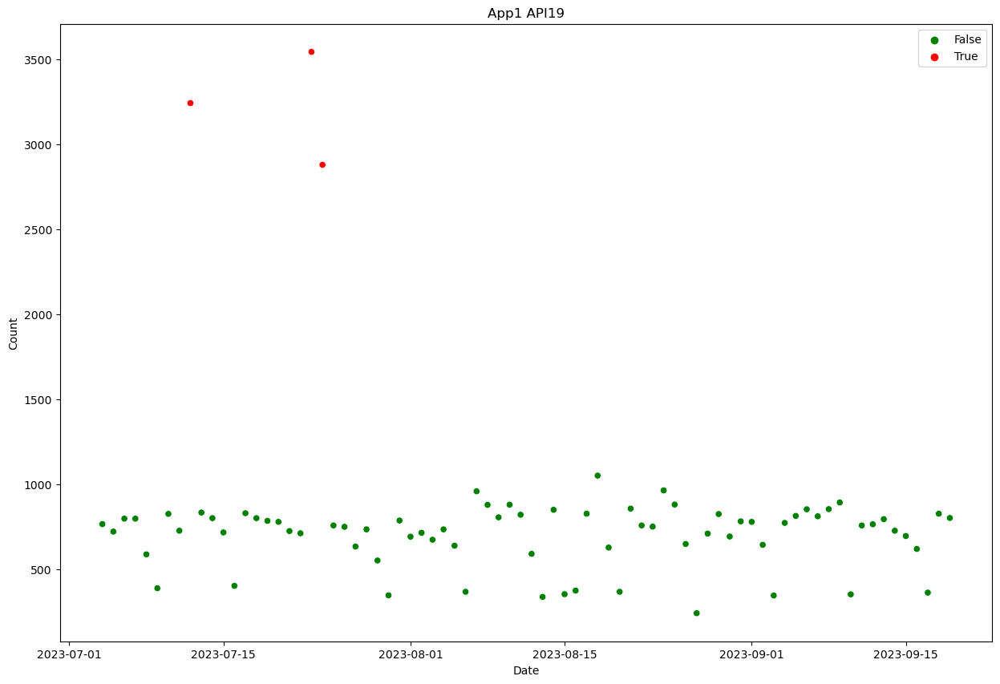

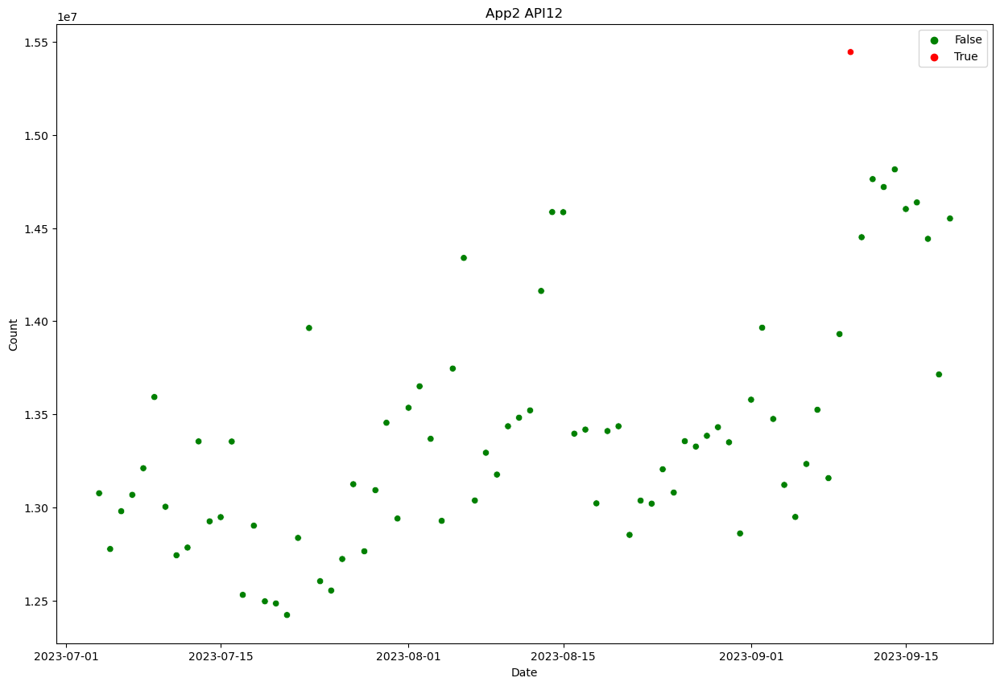

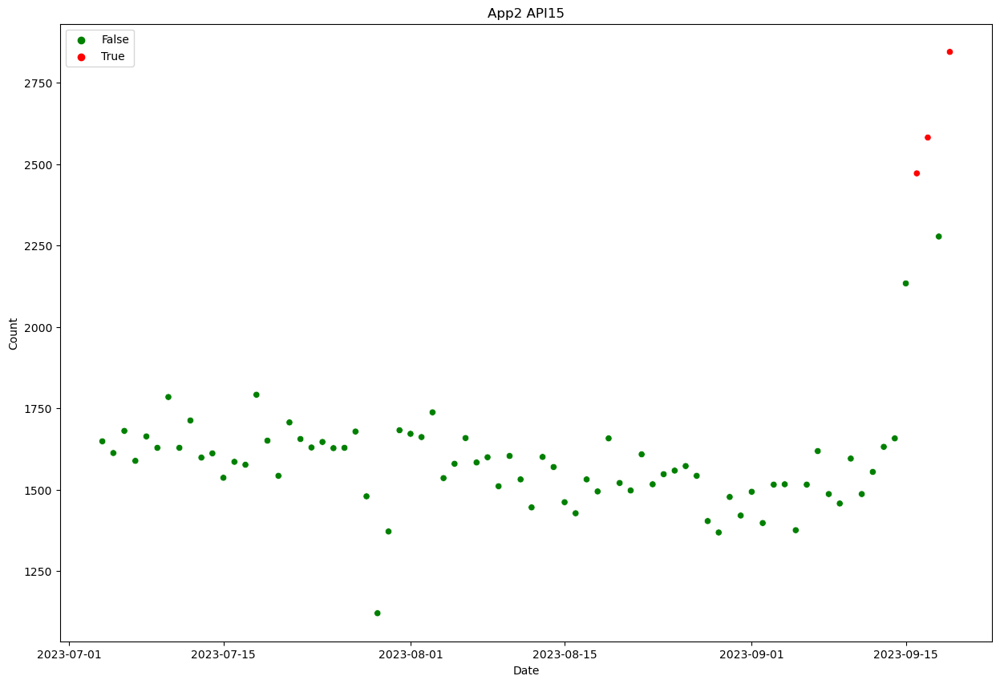

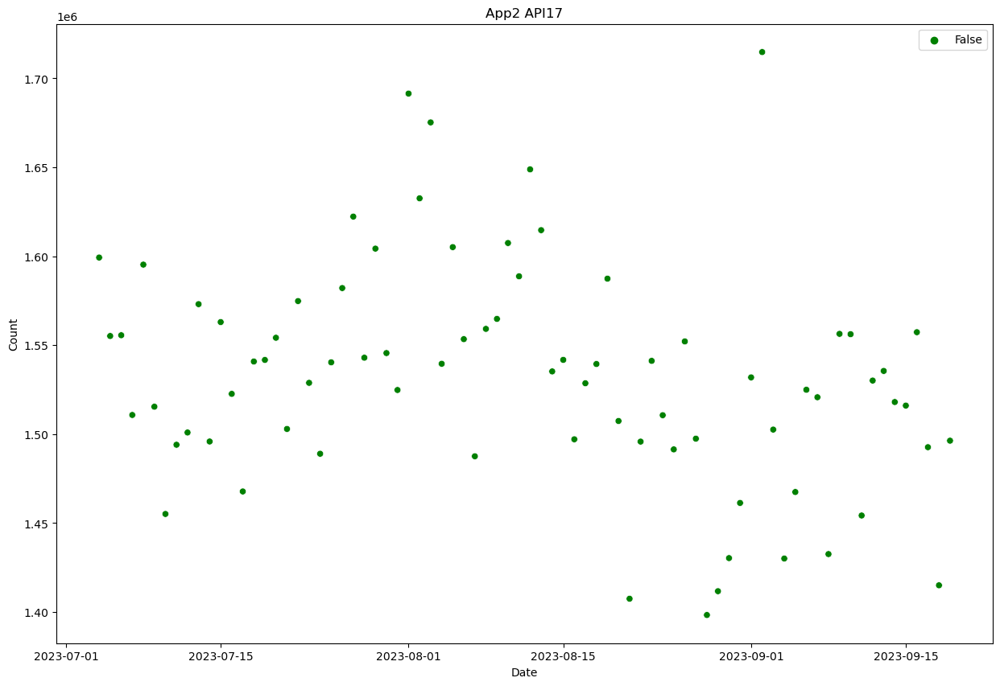

...

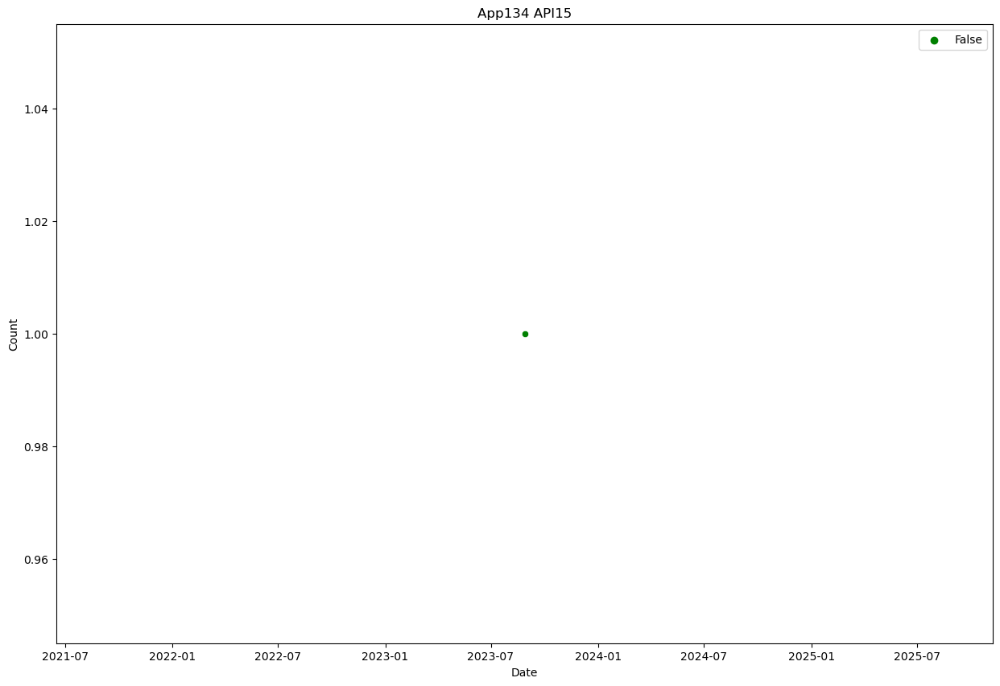

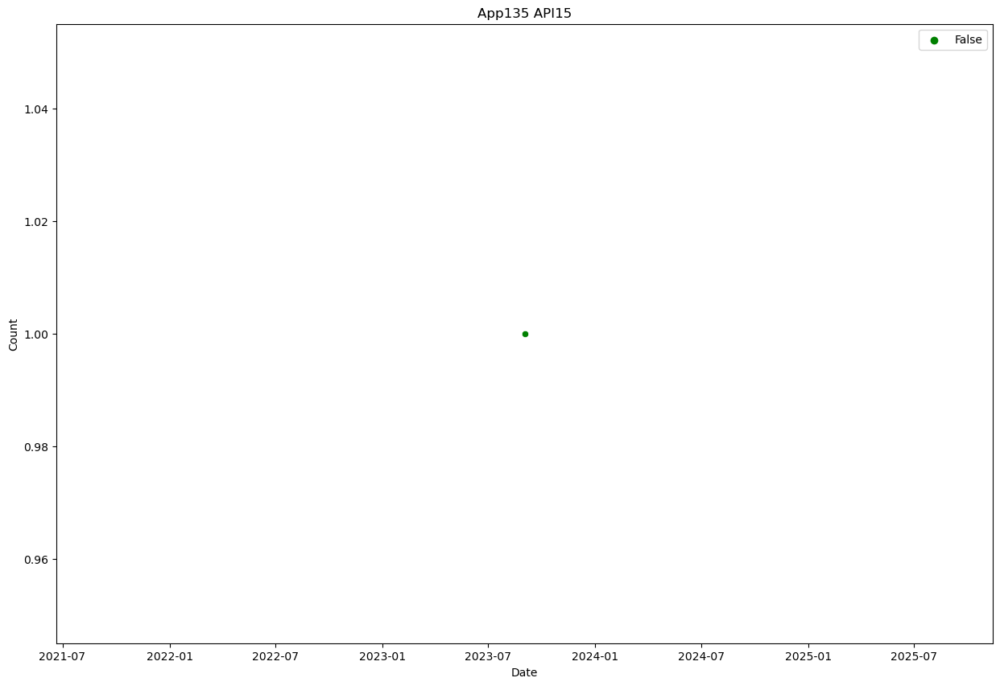

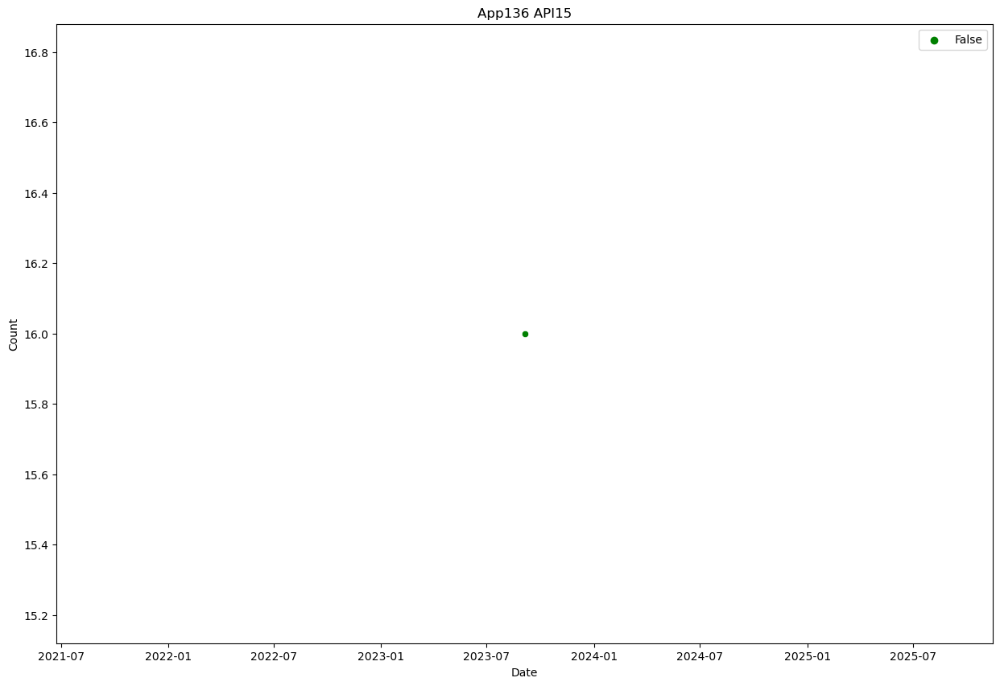

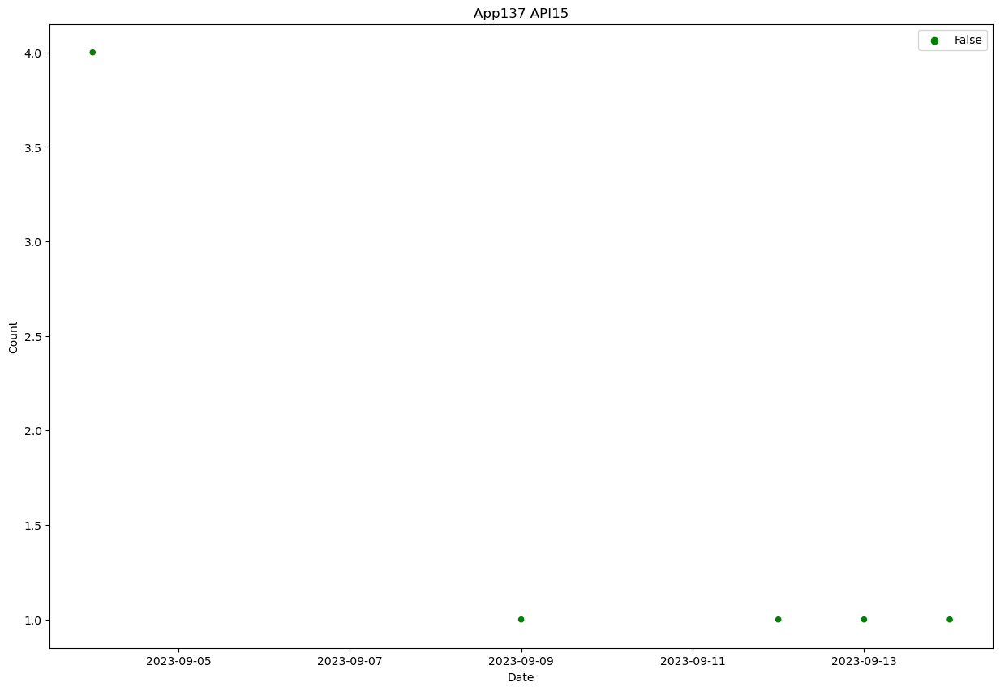

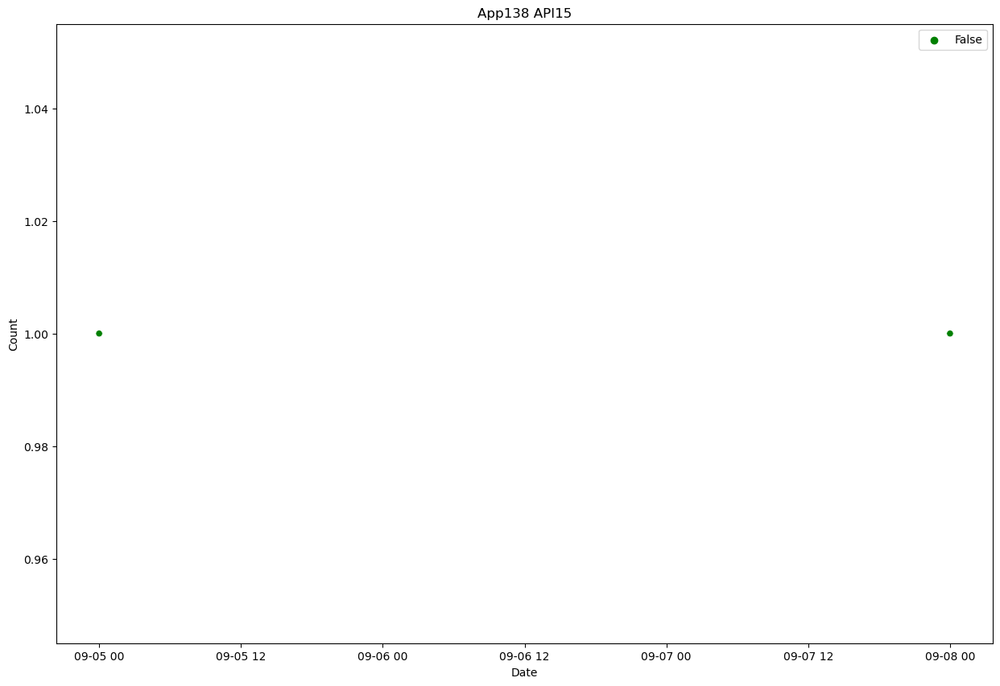

In [6]:
# Iterate over Applist and APIlist
for i, app_name in enumerate(Applist):
    for j, api_names in enumerate(APIlist[Applist.index(app_name)]):
        
        plt.figure(figsize=(15, 10))
       
        # Filter the data for the current app and API
        ind_data = data_gp[(data_gp.APPNAME == app_name) & (data_gp.API == api_names)]

        # Plot date vs count in the current subplot
        #axes[i, j].plot(ind_data.DATE, ind_data.SUM_COUNT, marker='o')

        zscored_count = zscore(ind_data['SUM_COUNT'])
        ind_data['zsc'] = zscored_count

        # Apply outlier detection and mark outliers
        outlier = pd.Series([0] * ind_data.shape[0], index=ind_data.index)
        outlier[((zscored_count < -4) | (zscored_count > 3))] = 1

        # Create a scatter plot in the current subplot
        if not outlier.empty:
            sns.scatterplot(data=ind_data, x='DATE', y='SUM_COUNT', hue=outlier.astype(bool), palette=['green', 'red'])
            plt.title(app_name + ' ' + api_names)
            plt.xlabel('Date')
            plt.ylabel('Count')
        else:
            sns.scatterplot(data=ind_data, x='DATE', y='SUM_COUNT', color='green', ax=axes[i, j])
            plt.title(app_name + ' ' + api_names)
            plt.xlabel('Date')
            plt.ylabel('Count')

plt.show()